# **The Abelian Sandpile Model: A Cellular Automaton Demonstrating Self-Organized Criticality**
#**(By DHANRAJ KUMAR, MS23258)**

*   **ABSTRACT**

The Abelian Sandpile Model is a two-dimensional cellular automaton that illustrates the concept of self-organized criticality. In this project, we study how simple local toppling rules, applied to a lattice of sand grains, lead to complex global behavior. When the number of grains at a site exceeds a critical threshold, redistribution to neighboring sites occurs, producing cascades known as avalanches. The system is analyzed mathematically and simulated computationally using Python. The results show the emergence of fractal patterns and a power-law distribution of avalanche sizes, indicating scale-invariant behavior. This model demonstrates how complex critical phenomena can arise naturally from simple deterministic rules without external parameter tuning.

*   **INTRODUCTION**

This term paper studies the Sandpile Model based on the pioneering work of Bak, Tang, and Wiesenfeld (1987), who introduced a simple model that exhibits self-organized criticality (SOC). Their work showed that complex, scale-invariant behavior can emerge naturally from very simple local rules. The model produces repetitive spatial structures and characteristic power-law distributions in avalanche sizes, making it a fundamental example in nonlinear physics.

Cellular automata provide an effective framework for studying such systems. They consist of a lattice of cells evolving through local interaction rules. Although the rules are simple, the collective behavior can be highly complex. In physics, this approach helps us understand systems where many small interactions lead to large-scale organization.

Unlike linear systems, which behave predictably and proportionally, nonlinear systems can generate instabilities and emergent patterns. The sandpile model belongs to this nonlinear class. One of the most important aspects of self-organized criticality is that, unlike equilibrium phase transitions requiring parameter tuning, these systems naturally evolve toward a critical state without external adjustment. This leads to scale-invariant behavior observed in natural phenomena such as earthquakes and neural activity.

In contrast to equilibrium phase transitions, where the external parameters, like temperature, have to be carefully adjusted, in self-organized critical systems, the critical state is reached automatically. Thus, the sandpile model is quite different from the standard phase transition models.

*   **THEORY AND MODEL DESCRIPTION**

### Lattice and Height Variable
Consider a two-dimensional square lattice of size N×N.
At each site (x,y), an integer variable, z(x,y) represents the number of sand grains (height) at that site.


---

### Stability Condition
A site is stable if:

                    z(x,y) < z_c​

For a square lattice with four nearest neighbors:

                    z_c ​= 4
The threshold value z_c=4 is due to the fact that in a two-dimensional square lattice, every lattice site has four nearest neighbors. Once the number of grains reaches or exceeds this value, the site becomes unstable and requires a redistribution of grains.                    

----
### Toppling Rule
The threshold value of 4 arises because each cell has four nearest neighbors in a two-dimensional square lattice. When the number of grains reaches 4, the site becomes unstable and redistributes one grain to each neighboring site.

The system evolves in discrete time steps, where unstable sites topple until a stable configuration is reached. This relaxation process defines an avalanche.

Two types of boundary conditions may be considered:

Open boundary — grains falling off the edge are lost (dissipative system).

Periodic boundary — edges wrap around, conserving total sand.

In this project, we use open boundary conditions, allowing dissipation at the edges.

If a site becomes unstable:

                        z(x,y)≥4
it topples according to:
                  
                        z(x,y)→z(x,y)−4
                        z(x+1,y)→z(x+1,y)+1
                        z(x−1,y)→z(x−1,y)+1
                        z(x,y+1)→z(x,y+1)+1
                        z(x,y−1)→z(x,y−1)+1
The process continues until all sites satisfy the stability condition.

----
### Abelian Property
A fundamental property of the sandpile model is that the final stable configuration does not depend on the order in which unstable sites are toppled.

Let T_A and T_B represent toppling operators at sites A and B. Since each operation subtracts four grains and redistributes them linearly to neighboring sites, the operators commute:

                                    T_A T_B z = T_B T_A z
This commutativity ensures uniqueness of the final configuration and defines the model as Abelian.                                    

----

### External Driving Mechanism
The system is driven slowly by adding one grain at a randomly chosen site:

                          z(x,y)→z(x,y)+1
After each addition, the system is allowed to relax completely before adding the next grain.
This slow driving ensures separation of timescales between grain addition and avalanche relaxation.

---
### Boundary Condition
We consider open boundary conditions.

If a boundary site topples, grains that would move outside the lattice are lost.
This dissipation prevents indefinite growth and allows the system to reach a steady state.                       

---
### Initial State
The system is initialized with:

                              z(x,y)=0
for all lattice sites.

The critical state is reached dynamically through repeated grain addition and relaxation.                              




In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import random
from matplotlib import animation, colors  # Import animation and colors modules

def initialize_grid(size):
    return np.zeros((size, size), dtype=int)

def iterate(grid):
    avalanche_size = 0
    avalanche_lifetime = 0
    relaxation_time = 0
    affected_sites = set()  # Track all unique sites that topple

     # closed boundary condition
    while np.any(grid >Z_c):
     relaxation_time += 1  # Every iteration through the while loop adds to relaxation time

     for ii, arr in enumerate(grid):
        for jj, val in enumerate(arr):

            if val > Z_c:
                grid[ii, jj] -= 4
                if ii > 0:
                    grid[ii - 1, jj] += 1
                if ii < len(grid) - 1:
                    grid[ii + 1, jj] += 1
                if jj > 0:
                    grid[ii, jj - 1] += 1
                if jj < len(grid) - 1:
                    grid[ii, jj + 1] += 1

                avalanche_size += 1

                affected_sites.add((ii, jj))  # Add the coordinates to affected_sites

     avalanche_lifetime += 1  # One iteration of toppling adds to the avalanche lifetime
    return avalanche_size, avalanche_lifetime, relaxation_time, len(affected_sites),grid


def add_random_grain(grid):
    """Add a grain of sand to a random location on the grid."""
    x = np.random.randint(0, grid.shape[0])  # Random row index
    y = np.random.randint(0, grid.shape[1])  # Random column index
    grid[x, y] += 1  # Add a grain to the random location
    return grid


def simulate(grid, iterations, size):
    # newgrid=grid.copy()

    avalanche_sizes = []
    avalanche_lifetimes = []
    relaxation_times = []
    affected_sites_list = [] # Changed to a more descriptive name
    list_of_matrices = []
    for i in range(iterations):
        grid = add_random_grain(grid)
        size, lifetime, relaxation, num_sites, updated_grid = iterate(grid) # Unpack the return values

        if size > 0:
            avalanche_sizes.append(size)
            avalanche_lifetimes.append(lifetime)
            relaxation_times.append(relaxation)
            affected_sites_list.append(num_sites) # Append num_sites to the list
            list_of_matrices.append(updated_grid.copy())

    return grid, avalanche_sizes, avalanche_lifetimes, relaxation_times, affected_sites_list, list_of_matrices # Return the list



# Parameters to put in the model

In [ ]:
#Parameters
Z_c = 3 # threshold value of slope
grid_size = 50  # Size of the grid
iterations = 50000 # Number of iterations

# Initialize the grid before calling simulate
grid = initialize_grid(grid_size) # Initialize grid here


# Run the simulation
grid, avalanche_sizes, avalanche_lifetimes, relaxation_times, affected_sites, list_of_matrices = simulate(grid, iterations, grid_size)

# Animated Visualization of Sandpile Dynamics

The animation illustrates the time development of the two-dimensional Abelian sandpile model under slow external forcing. As more and more grains are added to the system, the local height variable at some points exceeds the critical value z_c, making these points unstable. This leads to the onset of avalanche processes, where grains are transferred to neighboring sites following the toppling rule.

The avalanches occur with a broad distribution of sizes, ranging from small-scale localizations to large-scale events that involve a substantial part of the system. After a sufficiently large number of grain additions, the system self-organizes into a self-organized critical (SOC) state without any external adjustment of parameters. In this state, the system's dynamics becomes scale-invariant, featuring intermittent avalanches and the formation of complex spatial patterns.

This observation illustrates how complex macroscopic critical phenomena can be realized in a natural way as a consequence of simple deterministic local rules.

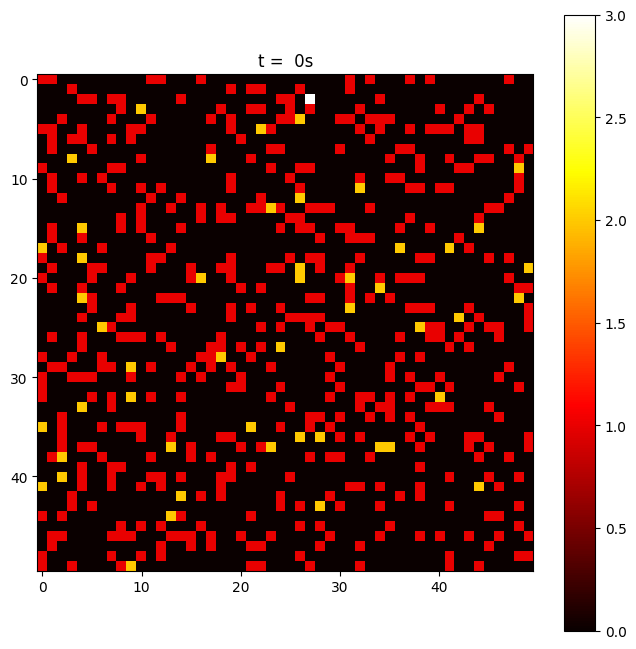

In [ ]:
fig, ax = plt.subplots(figsize=(8, 8))
# Function to update the plot for each frame
def update(frame):
    ax.clear()  # Clear the previous image
    im = ax.imshow(list_of_matrices[frame], cmap='hot')  #
    ax.set_title(f't =  {frame}s')
    ax.axis('on')

# Create the animation
ani = animation.FuncAnimation(
    fig, update, frames=len(list_of_matrices), interval=500, repeat=False
)  # interval=delay in ms


cmap = plt.get_cmap('hot')

# Create a normalizer for the colorbar
norm = colors.Normalize(vmin=np.min(list_of_matrices), vmax=np.max(list_of_matrices))

# Add the colorbar to the figure
cbar = fig.colorbar(plt.cm.ScalarMappable(norm=norm, cmap=cmap), ax=ax)


# Display the animation

# from IPython.display import HTML #Commented out as it will make HTML rendering the default output method even for other animations in your current notebook session.

# Save animation as HTML video
ani_html = ani.to_html5_video()

# Display the animation

from IPython.display import HTML #This imports the HTML display functionality here, where it's needed for the current output cell.

HTML(ani_html) #This displays the animation directly in the notebook output.

# Image of final state

System reached self organised criticality which can be showed by the verification of power laws

Text(0.5, 1.0, 'Final Grid')

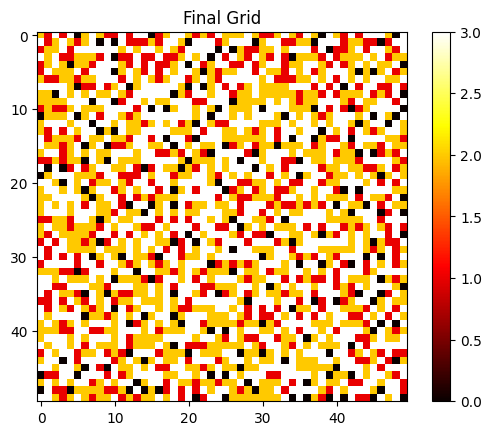

In [ ]:
plt.figure()
plt.imshow(grid, cmap='hot')  # Final grid in color
plt.colorbar()  # Adds a colorbar to the side
plt.title('Final Grid')

# POWER LAW ANALYSIS
According to classical sandpile SOC literature, several avalanche observables (such as size, area, and duration) follow approximate power-law distributions:

                                  𝐹(𝑥) ∝ 𝑥^𝑚
Taking the logarithm of both sides:                                                

                            logF(x) = m logx + C
where m is the scaling exponent and C is a constant.

Therefore, if power-law behavior is present, a log–log plot of F(x) versus 𝑥 should exhibit an approximately straight line. The slope of this line corresponds to the exponent m, confirming scale-invariant behavior characteristic of self-organized criticality.

# 1) Distribution of avalanche area (no. of affected sites)

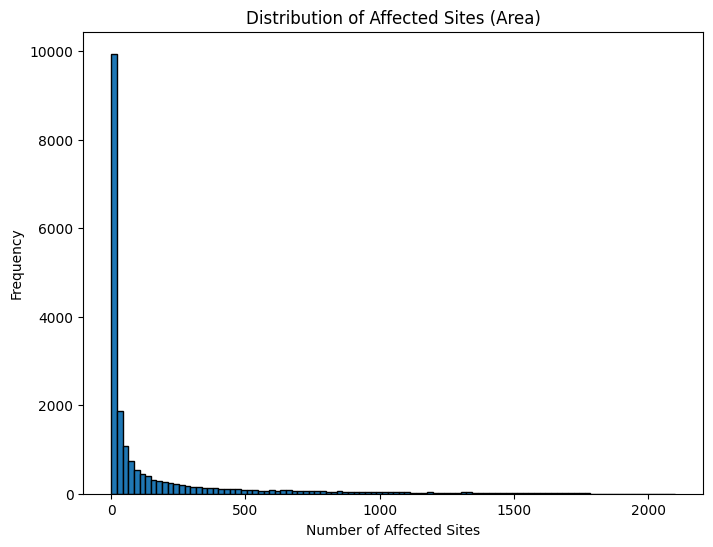

In [ ]:
#1) Distribution of Area(no. of affected sites)
plt.figure(figsize=(8, 6))
plt.hist(affected_sites, bins=100, edgecolor='black')
plt.title("Distribution of Affected Sites (Area)")
plt.xlabel("Number of Affected Sites")
plt.ylabel("Frequency")
plt.show()



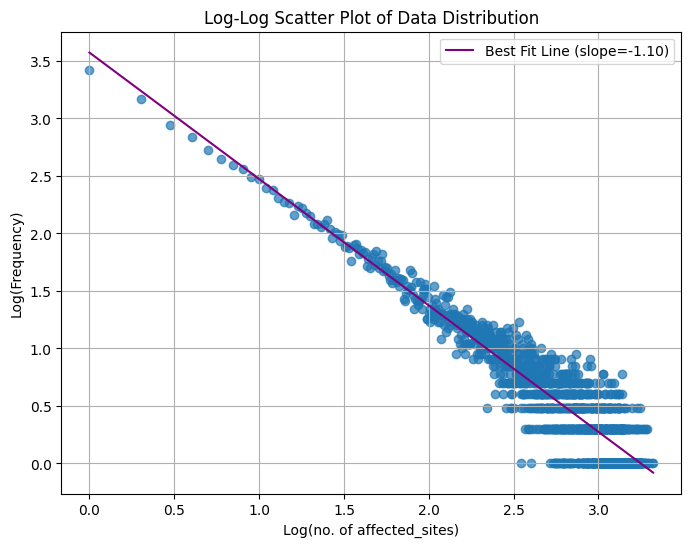

In [ ]:
import matplotlib.pyplot as plt
import numpy as np


unique_values, counts = np.unique(affected_sites, return_counts=True)

# Take logarithm of data and frequencies
log_data = np.log10(unique_values)
log_frequency = np.log10(counts)

# Create log-log scatter plot
plt.figure(figsize=(8, 6))
plt.scatter(log_data, log_frequency, marker='o', alpha=0.7)
 # Perform linear regression (best fit) on the log-log data
slope, intercept = np.polyfit(log_data, log_frequency, 1)

    # Generate the best fit line
best_fit_line = slope * log_data + intercept

    # Plot the best fit line
plt.plot(log_data, best_fit_line, color='purple', label=f'Best Fit Line (slope={slope:.2f})')
plt.xlabel("Log(no. of affected_sites)")
plt.ylabel("Log(Frequency)")
plt.title("Log-Log Scatter Plot of Data Distribution")
plt.grid(True)
plt.legend()
plt.show()

# 2) Avalanche lifetime
Avalanche lifetime is the total number of relaxation time steps required for the system to return to a stable configuration after a grain addition triggers instability. It measures the temporal duration of an avalanche and, in self-organized critical systems, typically follows a power-law distribution.

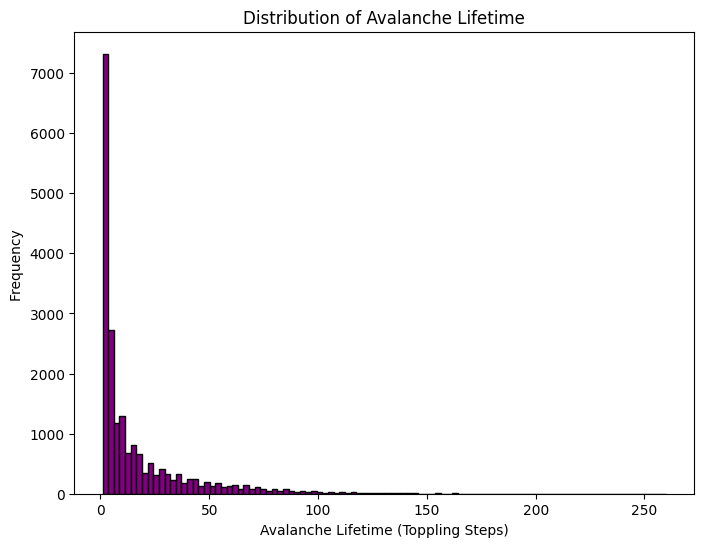

In [ ]:
#2) Distribution of avalanche lifetime
plt.figure(figsize=(8, 6))
plt.hist(avalanche_lifetimes, bins=100, color='purple', edgecolor='black')
plt.title("Distribution of Avalanche Lifetime")
plt.xlabel("Avalanche Lifetime (Toppling Steps)")
plt.ylabel("Frequency ")
plt.show()


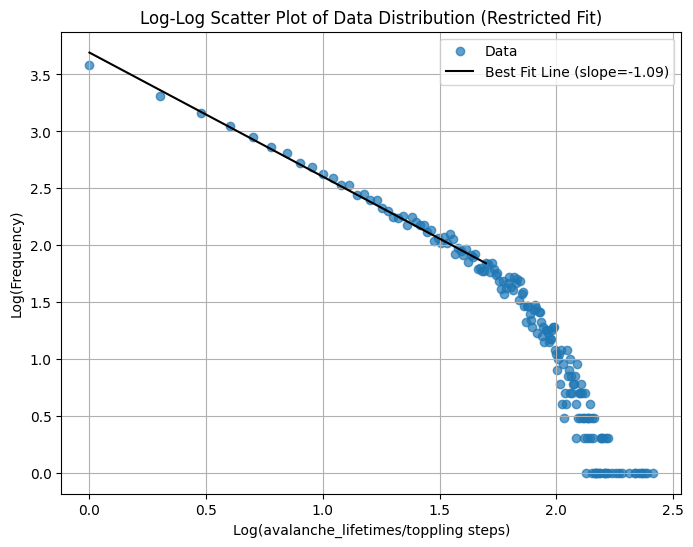

In [ ]:
import matplotlib.pyplot as plt
import numpy as np



# Find unique values and their counts
unique_values, counts = np.unique(avalanche_lifetimes, return_counts=True)

# Take logarithm of data and frequencies
log_data = np.log10(unique_values)
log_frequency = np.log10(counts)

# Create log-log scatter plot
plt.figure(figsize=(8, 6))
plt.scatter(log_data, log_frequency, marker='o', alpha=0.7, label='Data')

# Define a restricted range for the best fit line (adjust as needed)
fit_range = (0,1.7)  # You can change this to any domain range you want

# Apply the restriction to select only the values within the fit_range
mask = (log_data >= fit_range[0]) & (log_data <= fit_range[1])
log_data_fit = log_data[mask]
log_frequency_fit = log_frequency[mask]

# Perform linear regression (best fit) on the restricted data
slope, intercept = np.polyfit(log_data_fit, log_frequency_fit, 1)

# Generate the best fit line only for the restricted range
best_fit_line = slope * log_data_fit + intercept

# Plot the restricted best fit line
plt.plot(log_data_fit, best_fit_line, color='black', label=f'Best Fit Line (slope={slope:.2f})')

# Set labels, title, and grid
plt.xlabel("Log(avalanche_lifetimes/toppling steps)")
plt.ylabel("Log(Frequency)")
plt.title("Log-Log Scatter Plot of Data Distribution (Restricted Fit)")
plt.grid(True)
plt.legend()

# Display the plot
plt.show()


#  3) Relaxation time
Relaxation time is the time the system takes to become stable again after a grain causes instability. It tells us how long an avalanche continues before everything settles down.

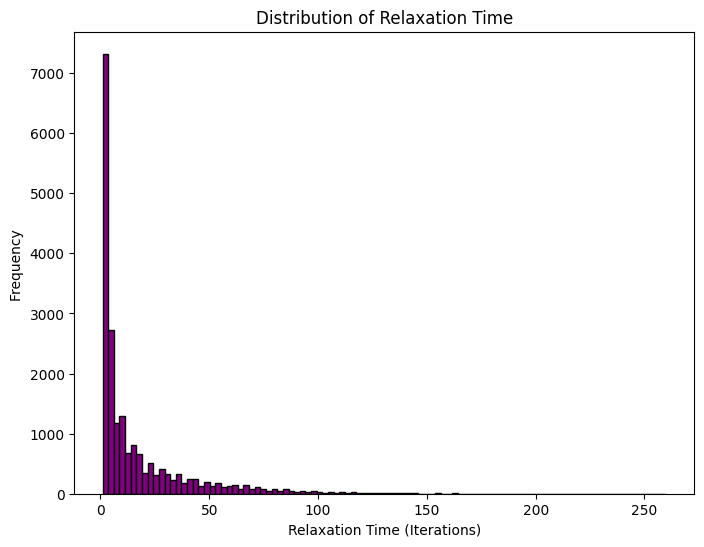

In [ ]:
# 3) Distribution of relaxation time
plt.figure(figsize=(8, 6))
plt.hist(relaxation_times, bins=100, color='purple', edgecolor='black')

plt.title("Distribution of Relaxation Time")
plt.xlabel("Relaxation Time (Iterations)")
plt.ylabel("Frequency ")
plt.show()

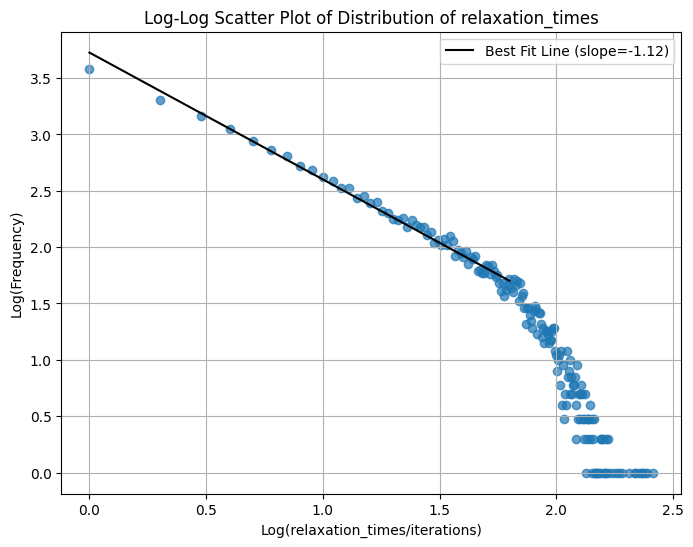

In [ ]:
import matplotlib.pyplot as plt
import numpy as np


unique_values, counts = np.unique(relaxation_times, return_counts=True)

# Take logarithm of data and frequencies
log_data = np.log10(unique_values)
log_frequency = np.log10(counts)

# Create log-log scatter plot
plt.figure(figsize=(8, 6))
plt.scatter(log_data, log_frequency, marker='o', alpha=0.7)
# Define a restricted range for the best fit line (adjust as needed)
fit_range = (0,1.8)  # You can change this to any domain range you want

# Apply the restriction to select only the values within the fit_range
mask = (log_data >= fit_range[0]) & (log_data <= fit_range[1])
log_data_fit = log_data[mask]
log_frequency_fit = log_frequency[mask]

# Perform linear regression (best fit) on the restricted data
slope, intercept = np.polyfit(log_data_fit, log_frequency_fit, 1)

# Generate the best fit line only for the restricted range
best_fit_line = slope * log_data_fit + intercept

# Plot the restricted best fit line
plt.plot(log_data_fit, best_fit_line, color='black', label=f'Best Fit Line (slope={slope:.2f})')

plt.xlabel("Log(relaxation_times/iterations)")
plt.ylabel("Log(Frequency)")
plt.title("Log-Log Scatter Plot of Distribution of relaxation_times")
plt.grid(True)
plt.legend()
plt.show()

# 4) Affected sites
Affected sites refer to the number of lattice sites that participate in an avalanche during a relaxation process. These are the sites whose heights change due to toppling events before the system becomes stable again.

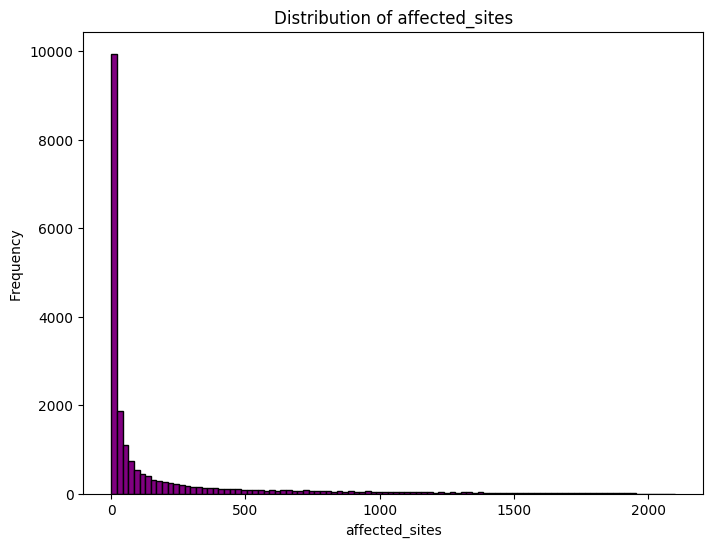

In [ ]:
# 4) Distribution of affected_sites
plt.figure(figsize=(8, 6))
plt.hist(affected_sites, bins=100, color='purple', edgecolor='black')

plt.title("Distribution of affected_sites")
plt.xlabel("affected_sites")
plt.ylabel("Frequency ")
plt.show()

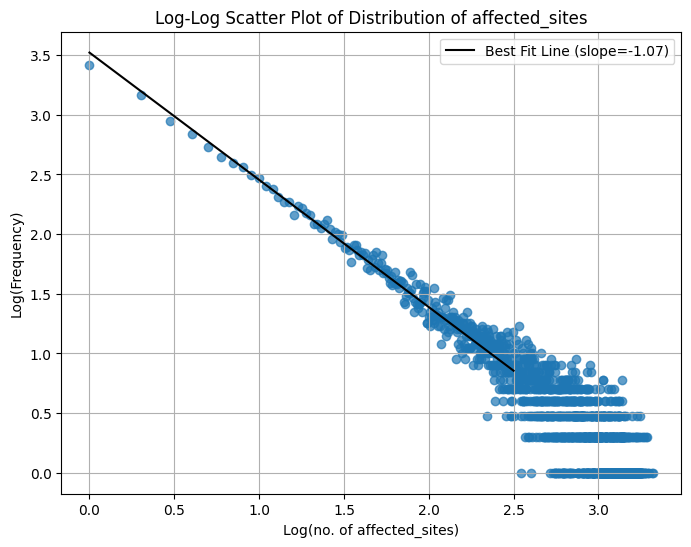

In [ ]:
import matplotlib.pyplot as plt
import numpy as np


unique_values, counts = np.unique(affected_sites, return_counts=True)

# Take logarithm of data and frequencies
log_data = np.log10(unique_values)
log_frequency = np.log10(counts)

# Create log-log scatter plot
plt.figure(figsize=(8, 6))
plt.scatter(log_data, log_frequency, marker='o', alpha=0.7)
# Define a restricted range for the best fit line (adjust as needed)
fit_range = (0,2.5)  # You can change this to any domain range you want

# Apply the restriction to select only the values within the fit_range
mask = (log_data >= fit_range[0]) & (log_data <= fit_range[1])
log_data_fit = log_data[mask]
log_frequency_fit = log_frequency[mask]

# Perform linear regression (best fit) on the restricted data
slope, intercept = np.polyfit(log_data_fit, log_frequency_fit, 1)

# Generate the best fit line only for the restricted range
best_fit_line = slope * log_data_fit + intercept

# Plot the restricted best fit line
plt.plot(log_data_fit, best_fit_line, color='black', label=f'Best Fit Line (slope={slope:.2f})')

plt.xlabel("Log(no. of affected_sites)")
plt.ylabel("Log(Frequency)")
plt.title("Log-Log Scatter Plot of Distribution of affected_sites")
plt.grid(True)
plt.legend()
plt.show()

# SUMMARY




Slope of log-log Graph of:



*   Affected sites: -1.07
*   Relaxation time: -1.15

*   Avalanche time: -1.10
*   Area: -1.11









# OBSERVATIONS


*   All the values of slope lie within the range[-1.12,-1.07]
*   As value of m ~ -1, hence sand pile model shows 1/f noise.

*  linear domain(1/f noise ) cutoff after some point due to finite size effect.






# REFERENCES


*   Self-organized criticality. Bak, Per and Tang, Chao and Wiesenfeld, Kurt. (Jul, 1988) Phys. Rev. A, 38: 364–374. doi: 10.1103/PhysRevA.38.364
*   chat-gpt for help in coding

